In [1]:
import pandas as pd
import DyLoPro as dlp

In [2]:
event_log = pd.read_csv('Traffic.csv',header=0)
case_id_key='case:concept:name'
activity_key='concept:name'
timestamp_key='time:timestamp'

In [6]:
categorical_casefeatures = []
numerical_eventfeatures = ['org:resource','amount', 'totalPaymentAmount', 'points', 'expense', 'paymentAmount','article']
categorical_eventfeatures = ['dismissal', 'lifecycle:transition','vehicleClass', 'concept:name']
#'notificationType','lastSent'
#numerical_casefeatures = ['']
start_date=None
end_date=None
outcome=None

In [7]:
event_log['time:timestamp'] = pd.to_datetime(event_log['time:timestamp'], format = 'mixed').dt.tz_convert('UTC')

In [8]:
traffic_plots = dlp.DynamicLogPlots(event_log, 
                                  case_id_key, 
                                  activity_key, 
                                  timestamp_key,
                                  categorical_eventfeatures= categorical_eventfeatures, 
                                  numerical_eventfeatures = numerical_eventfeatures, 
                                  #numerical_casefeatures = numerical_casefeatures, 
                                  categorical_casefeatures=categorical_casefeatures,
                                  start_date =start_date, 
                                  end_date = end_date, 
                                  outcome= outcome)

Preprocessing the data...


100%|██████████| 561470/561470 [00:00<00:00, 1892183.69it/s]


## __1. Variants__

In [11]:
var_df = traffic_plots.get_var_df(max_k = 10, counts = True)
print(var_df.to_string())

                                                                                                                                     variant  variant count
variant number                                                                                                                                             
1                                                (Create Fine, Send Fine, Insert Fine Notification, Add penalty, Send for Credit Collection)          56482
2                                                                                                                     (Create Fine, Payment)          46371
3                                                                                                                   (Create Fine, Send Fine)          20385
4                                                                   (Create Fine, Send Fine, Insert Fine Notification, Add penalty, Payment)           9520
5                                                          (Crea

Computing additional quarterly Throughput Time aggregations for each of the 10 most frequently occurring variants: 100%|██████████| 10/10 [00:00<00:00, 16.51it/s]


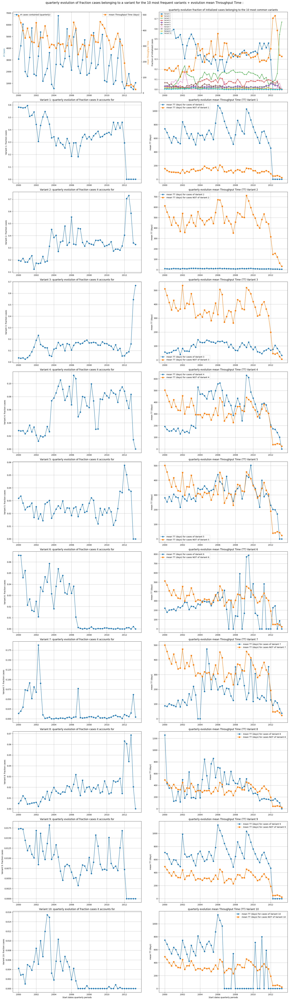

In [10]:
traffic_plots.topK_variants_evol(max_k = 10, frequency='quarterly', plt_type = 'type_tt', xtr_outlier_rem = False)

## __2.DFRs__

In [17]:
dfr_df = traffic_plots.get_DFR_df(max_k = 10, counts = True)
print(dfr_df.to_string())

                                                                     DFR  DFR count
DFR number                                                                         
1                                               (Create Fine, Send Fine)     103392
2                                  (Send Fine, Insert Fine Notification)      79757
3                                (Insert Fine Notification, Add penalty)      72334
4                              (Add penalty, Send for Credit Collection)      57182
5                                                 (Create Fine, Payment)      46952
6                                                 (Add penalty, Payment)      18621
7                                                     (Payment, Payment)       4306
8                                                 (Payment, Add penalty)       3902
9                                    (Insert Fine Notification, Payment)       3891
10          (Insert Fine Notification, Insert Date Appeal to Prefecture)    

#### 2.1 __TT__ 

Computing additional quarterly Throughput Time aggregations for each of the 10 most frequently occurring DFRs: 100%|██████████| 10/10 [00:00<00:00, 11.98it/s]


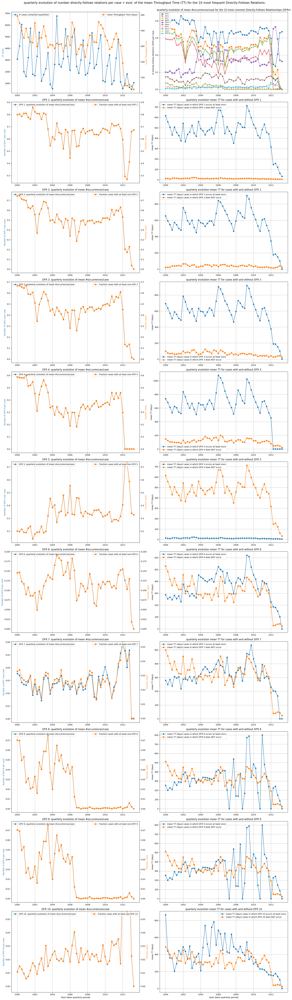

In [24]:
traffic_plots.topK_dfr_evol(frequency='quarterly', plt_type = 'type_tt')

#### 2.2 __Case Length (NEPC)__ 

Computing additional quarterly aggregations of the amount of events per case for each of the 10 most frequently occurring DFRs: 100%|██████████| 10/10 [00:00<00:00, 11.34it/s]


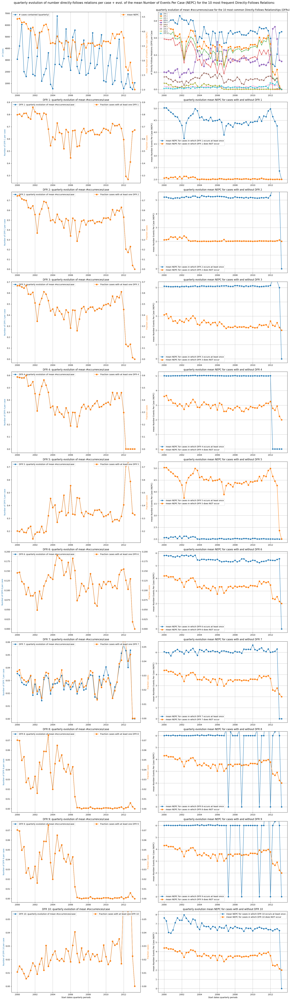

In [22]:
traffic_plots.topK_dfr_evol(frequency='quarterly',plt_type = 'type_events_case')

#### 2.3 __DFR Performance__ 

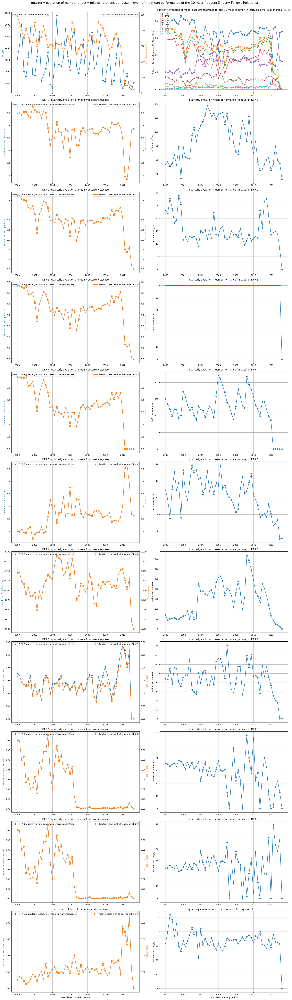

In [23]:
traffic_plots.topK_dfr_evol(frequency='quarterly', plt_type = 'type_dfr_performance', xtr_outlier_rem = False)

## __3. Categorical Case Features__ 
Only the categorical case features for which interesting trends / changes and patterns over time were identified are discussed here. For each categorical case feature, the evolutions pertaining to the most frequently occurring level are plotted first, those pertaining to the second most occurring level are plotted secondly, and so on. 

In [25]:
categorical_casefeatures

[]

## __4. Categorical Event Features__ 

Computing the quarterly aggregations for each of the 10 most frequently occurring levels of categorical event feature 'concept:name': 100%|██████████| 10/10 [00:00<00:00, 11.99it/s]


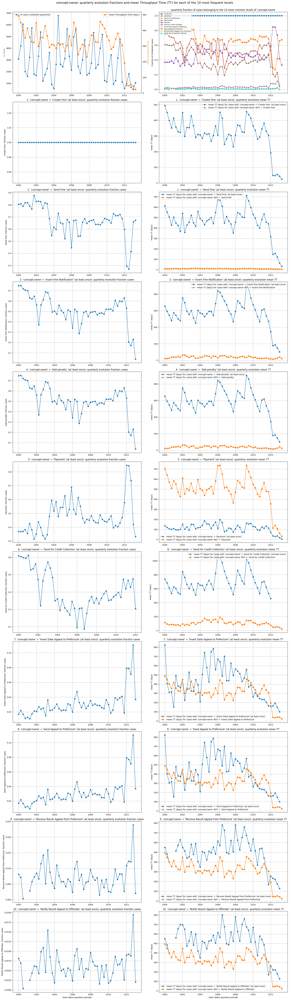

In [26]:
traffic_plots.topK_categorical_eventftr_evol(frequency='quarterly', event_feature='concept:name', plt_type = 'type_tt', xtr_outlier_rem = False)

## __5. Numerical Event Features__ 

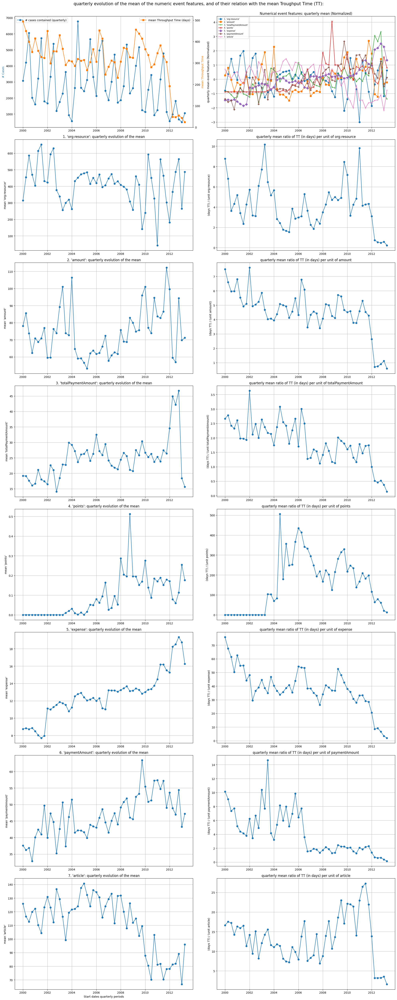

In [27]:
traffic_plots.num_eventfts_evol(frequency='quarterly', numeric_event_list= numerical_eventfeatures, plt_type = 'type_tt', 
                               numEventFt_transform='last', xtr_outlier_rem = False)